## Step 2: Training a simple model

In [9]:
import os
import time
import numpy as np
from pathlib import Path
from matplotlib import pyplot as plt

from wholeslidedata.interoperability.detectron2.iterator import WholeSlideDetectron2Iterator
from wholeslidedata.interoperability.detectron2.trainer import WholeSlideDectectron2Trainer
from wholeslidedata.interoperability.detectron2.predictor import Detectron2DetectionPredictor
from wholeslidedata.iterators import create_batch_iterator
from wholeslidedata.visualization.plotting import plot_boxes

from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.modeling import build_model

Setting up the training configuration and parameters (can also be defined in a separate yaml file).

In [13]:
user_config = {
    'wholeslidedata': {
        'default': {
            'yaml_source': "./configs/training_sample.yml",
#             "seed": 42,
            "image_backend": "asap",
            'labels': {
                "ROI": 0,
                "lymphocytes": 1
            },
        
            
            'batch_shape': {
                'batch_size': 10,
                'spacing': 0.5,
                'shape': [256,256,3],
                'y_shape': [1000, 6],
            },
            
            
            
            "annotation_parser": {
                "sample_label_names": ['roi'],
            },
            
            'point_sampler_name': "RandomPointSampler",
            'point_sampler': {
                "buffer": {'spacing': "${batch_shape.spacing}", 'value': -64},
            },
            
            'patch_label_sampler_name': 'DetectionPatchLabelSampler',
            'patch_label_sampler': {
                "max_number_objects": 1000,
                "detection_labels": ['lymphocytes'],
                    
            },
            
        }
    }
}

Creating the batch generator.

In [14]:
training_batch_generator = create_batch_iterator(
    user_config=user_config,
#     user_config=r'./configs/training_config.yml',
    mode='training',
    cpus=1,
    iterator_class=WholeSlideDetectron2Iterator,
)

Visualizing a sample batch.

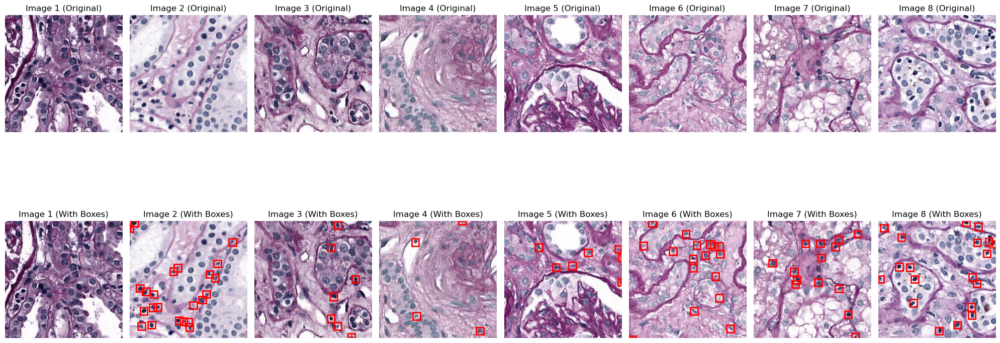

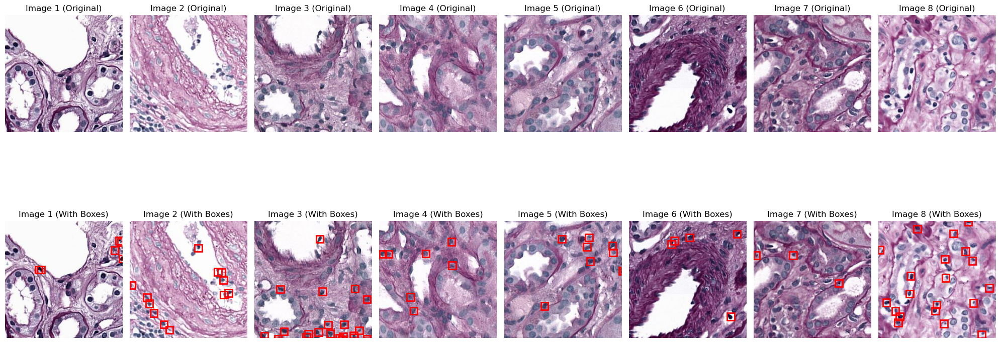

In [15]:
batch_dicts = next(training_batch_generator)

import matplotlib.pyplot as plt
import numpy as np

for _ in range(2):
    batch_dicts = next(training_batch_generator)  # トレーニング用バッチを取得
    fig, ax = plt.subplots(2, 8, figsize=(20, 10))  # 2行8列のサブプロット (元画像とボックス画像)

    for i in range(8):
        # 画像データ取得
        patch = batch_dicts[i]['image'].cpu().detach().numpy().transpose(1, 2, 0).astype('uint8')
        
        # バウンディングボックスとクラス取得
        _boxes = batch_dicts[i]['instances'].gt_boxes.tensor.cpu().detach().numpy()
        _class = batch_dicts[i]['instances'].gt_classes.cpu().detach().numpy()

        # バウンディングボックスの整形
        boxes = np.ones((len(_boxes), 6))
        boxes[..., :4] = _boxes
        max_width, max_height = batch_dicts[i]['instances'].image_size
        
        # --- 1行目: 元画像表示 ---
        ax[0, i].imshow(patch)
        ax[0, i].axis('off')  # 軸を非表示
        ax[0, i].set_title(f"Image {i+1} (Original)")

        # --- 2行目: ボックス付き画像表示 ---
        ax[1, i].imshow(patch)
        plot_boxes(boxes, max_width=max_width, max_height=max_height, axes=ax[1, i])  # ボックスを描画
        ax[1, i].axis('off')  # 軸を非表示
        ax[1, i].set_title(f"Image {i+1} (With Boxes)")

    plt.tight_layout()
    plt.show()


Creating the output folder for saving the model and results.

In [5]:
output_folder = Path('./outputs')
if not(os.path.isdir(output_folder)): os.mkdir (output_folder) 
cpus = 4

# Train the model

In [6]:
cfg = get_cfg()
# using faster rcnn architecture
cfg.merge_from_file(
    model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
)


cfg.DATASETS.TRAIN = ("detection_dataset2",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16, 24, 32]]

cfg.SOLVER.IMS_PER_BATCH = 10
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.MAX_ITER = 2000  # 2000 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.SOLVER.STEPS = (10, 100, 250)
cfg.SOLVER.WARMUP_ITERS = 0
cfg.SOLVER.GAMMA = 0.5

cfg.OUTPUT_DIR = str(output_folder)
output_folder.mkdir(parents=True, exist_ok=True)


model = build_model(cfg)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Parameter Count:\n" + str(pytorch_total_params))

trainer = WholeSlideDectectron2Trainer(cfg, user_config=user_config, cpus=cpus)
trainer.resume_or_load(resume=False)
trainer.train()

Parameter Count:
103962163
[12/07 14:07:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
 

Some model parameters or buffers are not found in the checkpoint:
backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.fc1.{bias, weight}
roi_heads.box_head.fc2.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
The checkpoint state_dict contains keys that are not used by the model:
  linear.{bias, weight}


[12/07 14:07:18 d2.engine.train_loop]: Starting training from iteration 0


/home/jubuntu/anaconda3/envs/monkey/lib/python3.10/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1729647382455/work/aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/07 14:07:26 d2.utils.events]:  eta: 0:04:44  iter: 19  total_loss: 0.9966  loss_cls: 0.2057  loss_box_reg: 0.1473  loss_rpn_cls: 0.5919  loss_rpn_loc: 0.04206    time: 0.1398  last_time: 0.1430  data_time: 0.2404  last_data_time: 0.0018   lr: 0.0005  max_mem: 2483M
[12/07 14:07:29 d2.utils.events]:  eta: 0:04:42  iter: 39  total_loss: 0.7883  loss_cls: 0.19  loss_box_reg: 0.1503  loss_rpn_cls: 0.3983  loss_rpn_loc: 0.03437    time: 0.1450  last_time: 0.1426  data_time: 0.0019  last_data_time: 0.0020   lr: 0.0005  max_mem: 2483M
[12/07 14:07:32 d2.utils.events]:  eta: 0:04:37  iter: 59  total_loss: 0.5334  loss_cls: 0.1648  loss_box_reg: 0.1276  loss_rpn_cls: 0.1794  loss_rpn_loc: 0.02941    time: 0.1418  last_time: 0.1321  data_time: 0.0018  last_data_time: 0.0020   lr: 0.0005  max_mem: 2483M
[12/07 14:07:34 d2.utils.events]:  eta: 0:04:18  iter: 79  total_loss: 0.564  loss_cls: 0.1995  loss_box_reg: 0.1908  loss_rpn_cls: 0.141  loss_rpn_loc: 0.03171    time: 0.1394  last_time: 0.1

Evaluation.

In [7]:
cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
)


cfg.DATASETS.TRAIN = ("detection_dataset2",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16, 24, 32]]

cfg.SOLVER.IMS_PER_BATCH = 10
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.MAX_ITER = 2000  # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.SOLVER.WARMUP_ITERS = 0
cfg.SOLVER.GAMMA = 0.5

cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.1

cfg.OUTPUT_DIR = str(output_folder)
output_folder.mkdir(parents=True, exist_ok=True)

cfg.MODEL.WEIGHTS = os.path.join(output_folder, "model_final.pth")

model = build_model(cfg)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Parameter Count:\n" + str(pytorch_total_params))

Parameter Count:
103962163


[12/07 14:15:00 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from outputs/model_final.pth ...


/home/jubuntu/anaconda3/envs/monkey/lib/python3.10/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_loca

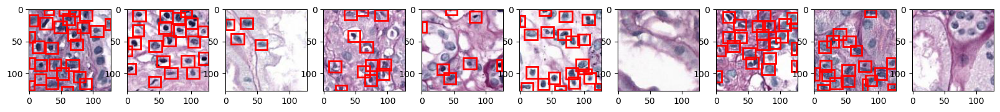

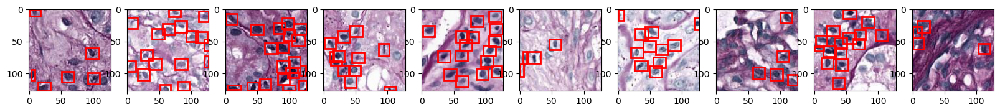

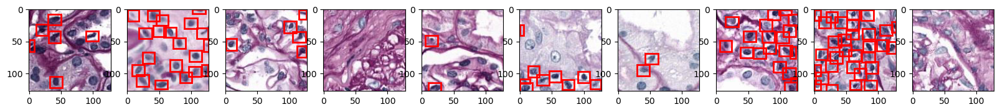

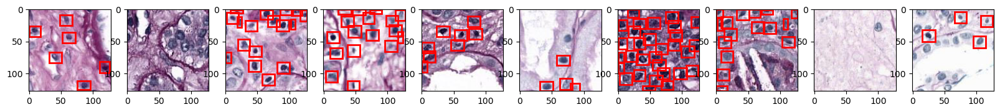

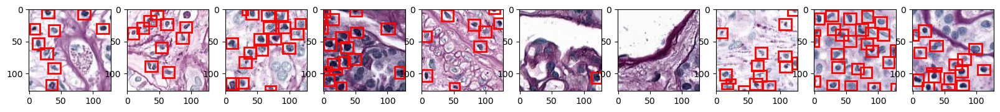

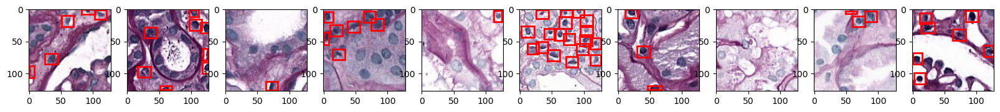

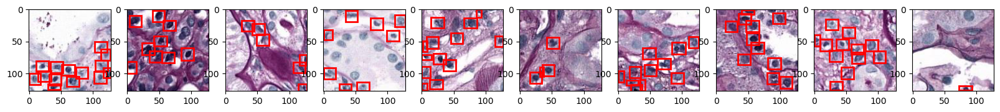

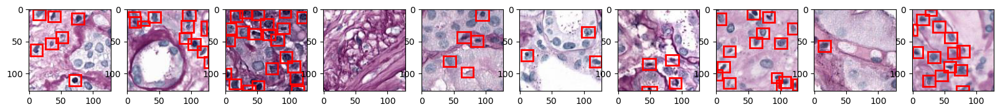

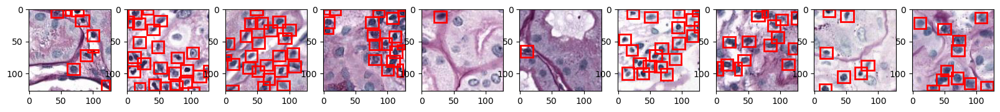

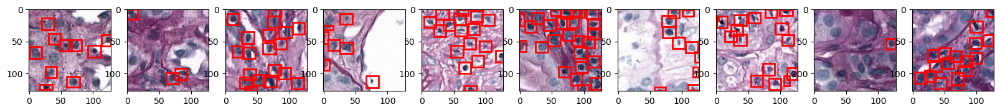

In [8]:
predictor = Detectron2DetectionPredictor(cfg)
with create_batch_iterator(
    user_config=user_config,
    mode='training',
    cpus=4,
) as training_batch_generator:
    for _ in range(10):
        fig, ax = plt.subplots(1,10, figsize=(20,10))
        batch_x, batch_y, info = next(training_batch_generator)
        predicted_batch = predictor.predict_on_batch(batch_x)
        for i in range(10):
            patch = batch_x[i]
            boxes =  predicted_batch[i]['boxes']
            confidences = predicted_batch[i]['confidences']
            filtered_boxes = []
            for box, confidence in zip(boxes, confidences):
                if confidence > 0.3:
                    filtered_boxes.append(box)
            ax[i].imshow(patch)
            plot_boxes(filtered_boxes, max_width=64, max_height=64, axes=ax[i])
        plt.show()